In [1]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

In [ ]:
import zipfile

# Replace <path_to_zip_file> with the path you copied earlier
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/UCF52.zip', 'r')
zip_ref.extractall('/content/dataset')
zip_ref.close()

# Replace <path_to_dataset> with the path to the unzipped dataset folder
dataset_path = '/content/dataset'


AttributeError: ignored

In [ ]:
!pip install pafy youtube-dl moviepy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 7.5 MB/s eta 0:00:00
  Attempting uninstall: imageio
    Found existing installation: imageio 2.4.1
    Uninstalling imageio-2.4.1:
      Successfully uninstalled imageio-2.4.1


In [ ]:
import os 
import cv2
import pafy
import math
import random
import pandas as pd
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

!pip install moviepy
!pip3 install imageio==2.4.1
!pip install --upgrade imageio-ffmpeg
from moviepy.editor import * 
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential 
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached imageio-2.4.1-py3-none-any.whl
  Attempting uninstall: imageio
    Found existing installation: imageio 2.31.0
    Uninstalling imageio-2.31.0:
      Successfully uninstalled imageio-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
moviepy 1.0.3 requires imageio<3.0,>=2.5; python_version >= "3.4", but you have imageio 2.4.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
print(tf.__version__)


2.12.0


In [ ]:
print(pd.__version__)


1.5.3


In [ ]:
import sys

os_version = sys.platform
print(os_version)


linux


In [ ]:
print(cv2.__version__)


4.7.0


In [ ]:
print(pafy.__version__)


0.5.5


In [ ]:
print(np.__version__)


1.22.4


In [ ]:
import matplotlib

print(matplotlib.__version__)



3.7.1


In [ ]:
import moviepy
print(moviepy.__version__)



1.0.3


In [ ]:
print(keras.__version__)


2.12.0


In [ ]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

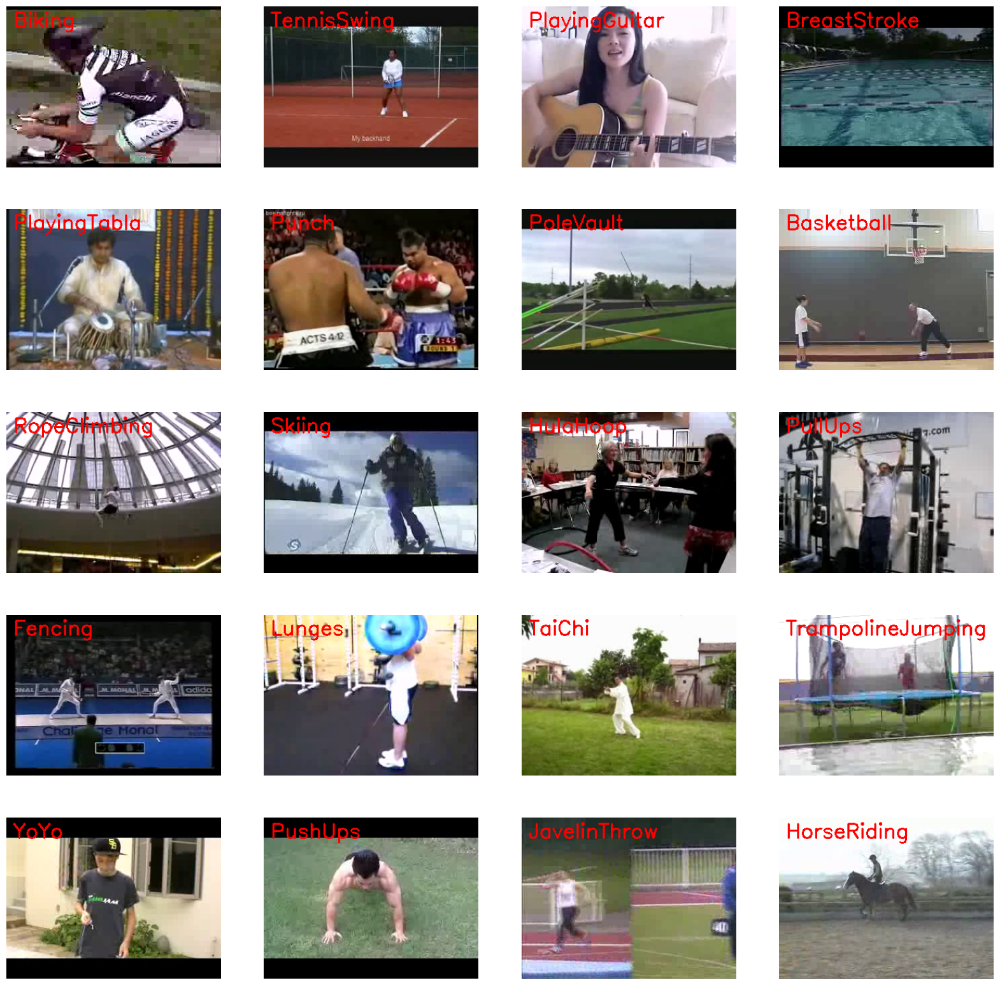

In [ ]:
plt.figure(figsize=(20, 20))

# Get the names of all classes from dataset
all_classes_names = os.listdir('/content/dataset/UCF50/UCF50')
#print(all_classes_names)
#print(len(all_classes_names))
# Generate a list of 20 random values outof 50 values.
random_range = random.sample(range(len(all_classes_names)), 20)
#print(len(all_classes_names))

# Iterating through all the generated random values
for counter, random_index in enumerate(random_range, 1):

  #Retrieve class name through Random index
  selected_class_Name = all_classes_names[random_index]

  #Retrieve the list of all the video files present in the random directory.
  video_files_names_list = os.listdir(f'/content/dataset/UCF50/UCF50/{selected_class_Name}')

  #Random selected video file from the list retrieved from the randomly selected directory
  selected_video_file_name = random.choice(video_files_names_list)

  #Initialize a VideoCapture object to read from the video file.
  video_reader = cv2.VideoCapture(f'/content/dataset/UCF50/UCF50/{selected_class_Name}/{selected_video_file_name}')

  #Read the first frame of the video file.
  _, bgr_frame = video_reader.read()

  #Release the VideoCapture object.
  video_reader.release()

  #Convert the frame from BGR into RGB format.
  rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

  #Write the class name on the video frame 
  cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

  #Display the frame
  plt.subplot(5, 4, counter) 
  plt.imshow(rgb_frame) 
  plt.axis('off')

In [ ]:
# Now we will resized our dataset along with frames and actions

IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

SEQUENCE_LENGTH = 40

DATASET_DIR = "/content/dataset/UCF50/UCF50"

CLASSES_LIST = ["Punch", "Fire", "Nunchucks", "TaiChi", "StreetFighting"]

In [ ]:
def frames_extraction(video_path="/content/dataset/UCF50/UCF50"):
  '''
  This function extract the required frames from video.
  Args:
    video_path: The path of video in disk.
  Returns:
    frames_list: A list containing the resized and normalized frames of video.
  '''

  # Declaring a list to store video frames.
  frames_list = []

  #Reading the video using the VideoCapture object.
  video_reader = cv2.VideoCapture(video_path)

  #Getting the total number of frames from the video.
  video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

  #Calculating the interval after which frames will be added to the list.
  skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

  #Iterate through the video Frames.
  for frame_counter in range(SEQUENCE_LENGTH):

    #Set the current frame position of video.
    video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

    #Reading the frame from the video.
    success, frame = video_reader.read()

    #Check if Video frame is not successfully read then break the loop.
    if not success:
      break

    #Resize hte frame to fixed height and width.
    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

    #Normalize the resize frames by dividing it with 255 so that each pixel value then lies between 0 and 1.
    normalized_frame = resized_frame / 255

    #Append the normalized frame into the frames list
    frames_list.append(normalized_frame)

  #Release the videoCapture object.
  video_reader.release()

  #Return the frames list.
  return frames_list  

In [ ]:
# Function for dataset creation

def create_dataset():
  '''

  This fuction will extract the data of the selected classes and create the required dataset.
  Returns:
  features:  A list containing the extracted frames of the videos.
  labels:    A list containing the indexes of the classes associated.
  video_files_paths: A list containing the paths of the video in the disk.

  '''
  #Decleared Empty Lists to store the following.
  features = []
  labels = []
  video_files_paths = []

  #Iterating through all the classes mentioned in the classes list
  for class_index, class_name in enumerate(CLASSES_LIST):

    #Display the name of the class whose data is being extracted.
    print(f'Extracting Data of Class: {class_name}')

    #Get the list of video files present in the specific class name directory.
    files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

    #Iterate through all the files present in the files list.
    for file_name in files_list:
      #get the complete video path
      video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

      #print(video_file_path)

      #Extract the frames of the video file.
      frames = frames_extraction(video_file_path)

      #Checking if the extracted frames are equal to SEQUENCE_LENGTH specified above.
      #And ignore the videos having frame less than the SEQUENCE_LENGTH.
      #print(len(frames))
      #print(SEQUENCE_LENGTH)

      if len(frames) == SEQUENCE_LENGTH:

        #Append the data to the respective lists.
        features.append(frames)
        #print(class_index)
        labels.append(class_index)
        video_files_paths.append(video_file_path)

  #Converting the list to numpy arrays
  features = np.asarray(features)
  #print(labels)
  labels = np.array(labels)
  
  #Return the frames, class index and video file path.
  return features, labels, video_files_paths


In [ ]:
#Creating the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: Punch
Extracting Data of Class: Fire
Extracting Data of Class: Nunchucks
Extracting Data of Class: TaiChi
Extracting Data of Class: StreetFighting


In [ ]:
#Using Keras to categorical method to convert labels into one hot encoding vectors

one_hot_encoded_labels = to_categorical(labels)

In [ ]:
# Returns shape of features & labels
print(features.shape, labels.shape)

(456, 40, 64, 64, 3) (456,)


features(videos, Frames per video, hieght, width, rgb)
labels(videos)

In [ ]:
#Splitting the dataset into Train and Test
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, 
                                                                            test_size = 0.25, shuffle = True, random_state = seed_constant )

In [ ]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()
    
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu'), input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    
    model.add(TimeDistributed(Conv2D(128, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    
    model.add(TimeDistributed(Conv2D(256, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))

                                      
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model

In [ ]:
#Create model Instance
model = create_LRCN_model()

# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'accuracy', patience = 50, mode = 'max', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'RMSProp', metrics = ["accuracy"])
 
# Start training the model.
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 150, batch_size = 4 , shuffle = True, validation_split = 0.25, callbacks = [early_stopping_callback])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 40, 64, 64, 32)   896       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 40, 16, 16, 32)   0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 40, 16, 16, 64)   18496     
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 40, 4, 4, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 40, 4, 4, 128)    7

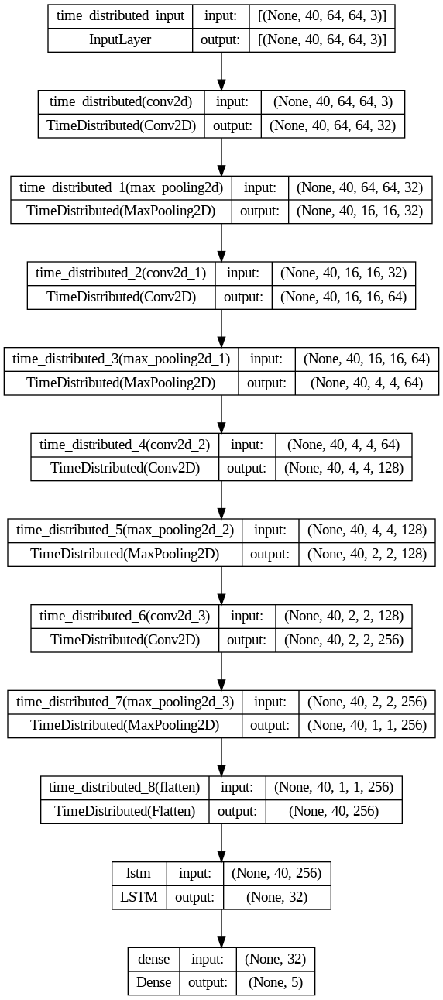

In [ ]:
# Plot the structure of the contructed model.
plot_model(model, to_file = 'model_structure_plot.png', show_shapes = True, show_layer_names = True)


In [ ]:
 # Evaluate the trained model
 model_evaluation_history = model.evaluate(features_test, labels_test)

4/4 [==============================] - 1s 165ms/step - loss: 0.1829 - accuracy: 0.9474


In [ ]:
 # Get the loss and accuracy from model
 model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

 # Define the string date format
 # Current date and time
 # Convert the datetime object to string according to the style mentioned in date
 date_time_format = '%Y_%m_%d_%H_%M_%S'
 current_date_time_dt = dt.datetime.now()
 current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

 # Define a name for model
 model_file_name = f'human_action_recognition{current_date_time_string}__Loss_{model_evaluation_loss}__Accuracy_{model_evaluation_accuracy}.h5'

 # Save your model
 model.save("/content/drive/MyDrive/Model_Final_Year/"+str(model_file_name))

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
          model_training history: A history object containing a record of training and validation
                                  loss values and metrics values at successive epochs                         
          metric_name_1:          The name of the first metric that needs to be plotted in the graph.
          metric_name_2:          The name of the second metric that needs to be plotted in the graph.
          plot_name:              The title of the graph.
    '''

    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()
    

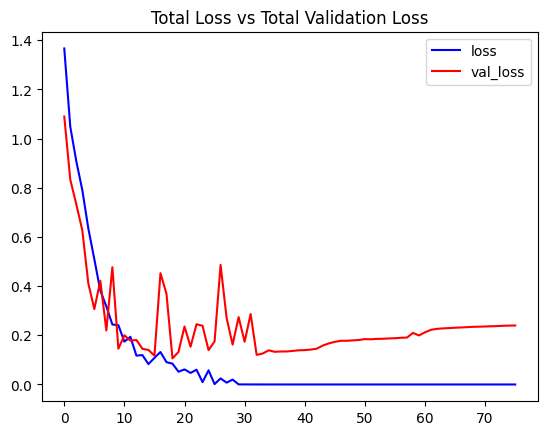

In [ ]:

    # Visualize the training and validation loss metrics.
    plot_metric(model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')	
   

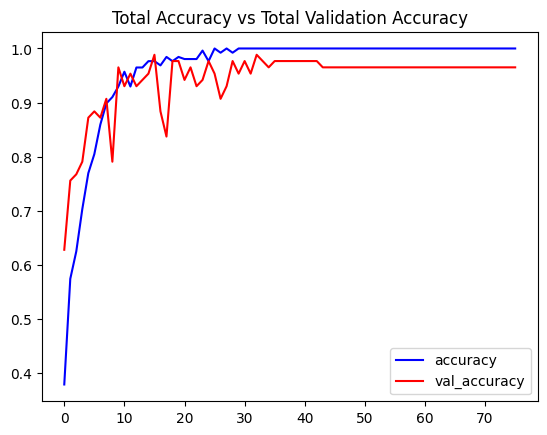

In [ ]:
# Visualize the training and validation accuracy metrics.
plot_metric(model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')	


In [ ]:
!sudo rm /usr/local/bin/youtube-dl

In [ ]:
!sudo wget https://yt-dl.org/downloads/latest/youtube-dl -O /usr/local/bin/youtube-dl
!sudo chmod a+rx /usr/local/bin/youtube-dl
!hash -r


--2023-06-09 10:00:36--  https://yt-dl.org/downloads/latest/youtube-dl
Resolving yt-dl.org (yt-dl.org)... 95.143.172.170, 2001:1a50:11:0:5f:8f:acaa:177
Connecting to yt-dl.org (yt-dl.org)|95.143.172.170|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://yt-dl.org/downloads/2021.12.17/youtube-dl [following]
--2023-06-09 10:00:37--  https://yt-dl.org/downloads/2021.12.17/youtube-dl
Reusing existing connection to yt-dl.org:443.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/ytdl-org/youtube-dl/releases/download/2021.12.17/youtube-dl [following]
--2023-06-09 10:00:37--  https://github.com/ytdl-org/youtube-dl/releases/download/2021.12.17/youtube-dl
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-release-asset-2e65be/1039520/65476747-919e-4

In [ ]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 14.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 45.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.0/157.0 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 91.5 MB/s eta 0:00:00
  Created wheel for yt-dlp: filename=yt_dlp-2023.3.4-py2.py3-none-any.whl size=2750017 sha256=b2ed0f21a521ea19f871dfcd2a163ac05a4352620b8f298cd852eef3ca89a076
  Stored in directory: /tmp/pip-ephem-wheel-cache-5u2_myes/wheels/4c/91/d1/c5369304e

In [ ]:
import yt_dlp as youtube_dl

In [ ]:
!pip install --upgrade youtube-dl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

def download_youtube_videos(youtube_video_url, output_directory, verbose=False):
      '''
    This function downloads the youtube video whose URL is passed to it as an argument.
    Args:
        youtube_video_url: URL of the video that is required to be downloaded.
        output_directory: The directory path to which the video needs to be stored after downloading.
    Returns:
        title: The title of the downloaded youtube video.
    '''
      ydl_opts = {
        'outtmpl': f'{output_directory}/%(title)s.%(ext)s',
        'format': 'mp4',
        'verbose': verbose  # Include verbose flag here
    }
      with youtube_dl.YoutubeDL(ydl_opts) as ydl:
        info_dict = ydl.extract_info(youtube_video_url, download=True)
        return info_dict.get('title', None)

      # Create a video object which contains useful information about the video.
      video = pafy.new(youtube_video_url)

      # Retrieve the title of the video.
      title = video.title

      # Get the best available quality object for the video.
      video_best = video.getbest()

      # Construct the output file path.
      output_file_path = f'{output_directory}/{title}.mp4'

      # Download the youtube video at the best available quality and store it to the contructed path.
      video_best.download(filepath = output_file_path, quiet = True)

      # Return the video title.
      return title


In [ ]:
!pip install --upgrade opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/Model_Final_Test/human_action_recognition2023_06_09_06_43_15__Loss_0.37686485052108765__Accuracy_0.9122806787490845.h5')

In [ ]:
'''CREATE A FUNCTION TO PERFORM ACTION RECOGNITION ON VIDEOS'''

def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):

    '''
     This function will perform action recognition on a video using the ConvLSTM Model.
     Args:
     video_file_path: The path of the video stored in the disk on which the action recognition is to be performed.
     output_file_path: The path where the ouput video with the predicted action being performed overlayed will be stored.
     SEQUENCE_LENGTH: The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Initialize the Videowriter Object to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M','P','4','V'),
                                video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ' '
    print(predicted_class_name)
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        # Read the frame.
        ok, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = model.predict(np.expand_dims(frames_queue, axis = 0))[0]
                                                                                
            # Get the Index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
            print(predicted_label)
        # Write predicted class name on top of the frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        video_writer.write(frame)

    # Release the VideoCapture and VideoWriter objects.
    video_reader.release()
    video_writer.release()
    print(predicted_class_name)

In [ ]:
import os

In [ ]:
  # Make the Output directory if it does not exist
  test_videos_directory = 'test_videos'
  os.makedirs(test_videos_directory, exist_ok = True)

  # Download a YouTube Video.
  video_title = video_title = download_youtube_videos('https://www.youtube.com/shorts/_dX_yYK1V0M/', test_videos_directory, verbose=True)
  # Get the YouTube Video's path we just downloaded.
  input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'


[debug] Encodings: locale UTF-8, fs utf-8, pref UTF-8, out UTF-8 (No ANSI), error UTF-8 (No ANSI), screen UTF-8 (No ANSI)
[debug] yt-dlp version stable@2023.03.04 [392389b7d] API
[debug] params: {'outtmpl': 'test_videos/%(title)s.%(ext)s', 'format': 'mp4', 'verbose': True, 'compat_opts': set()}
[debug] Lazy loading extractors is disabled
[debug] Python 3.10.12 (CPython x86_64 64bit) - Linux-5.15.107+-x86_64-with-glibc2.31 (OpenSSL 1.1.1f  31 Mar 2020, glibc 2.31)
[debug] exe versions: ffmpeg 4.2.7, ffprobe 4.2.7
[debug] Optional libraries: Cryptodome-3.18.0, brotli-1.0.9, certifi-2022.12.07, mutagen-1.46.0, sqlite3-2.6.0, websockets-11.0.3
[debug] Proxy map: {'colab_language_server': '/usr/colab/bin/language_service'}
[debug] Loaded 1841 extractors


[youtube] Extracting URL: https://www.youtube.com/shorts/_dX_yYK1V0M/
[youtube] _dX_yYK1V0M: Downloading webpage
[youtube] _dX_yYK1V0M: Downloading android player API JSON


[debug] Sort order given by extractor: quality, res, fps, hdr:12, source, vcodec:vp9.2, channels, acodec, lang, proto
[debug] Formats sorted by: hasvid, ie_pref, quality, res, fps, hdr:12(7), source, vcodec:vp9.2(10), channels, acodec, lang, proto, filesize, fs_approx, tbr, vbr, abr, asr, vext, aext, hasaud, id


[info] _dX_yYK1V0M: Downloading 1 format(s): 22


[debug] Invoking http downloader on "https://rr2---sn-qxo7rn7k.googlevideo.com/videoplayback?expire=1686326472&ei=aPiCZO-FBbKb2_gP9pmmgA0&ip=34.68.244.55&id=o-AD_u8yQSAhmaR3i9D8GNiULwQanMvbwqwHtWZO2XIvhJ&itag=22&source=youtube&requiressl=yes&mh=6i&mm=31%2C29&mn=sn-qxo7rn7k%2Csn-qxoednee&ms=au%2Crdu&mv=m&mvi=2&pl=20&ctier=SH&spc=qEK7BzZl2Yv24qIaqb6D0ncv8LtiwlmUoCUc4EQw2g&vprv=1&svpuc=1&mime=video%2Fmp4&cnr=14&ratebypass=yes&dur=34.063&lmt=1680080123983283&mt=1686304628&fvip=2&fexp=24007246%2C51000012%2C51000022&c=ANDROID&txp=5532434&sparams=expire%2Cei%2Cip%2Cid%2Citag%2Csource%2Crequiressl%2Cctier%2Cspc%2Cvprv%2Csvpuc%2Cmime%2Ccnr%2Cratebypass%2Cdur%2Clmt&sig=AOq0QJ8wRgIhALyXS-HHMF3StyWLLCQkaYSAI6Eo20V0wyE6nn8UdytOAiEA312kP6txSd1FX_P0mXfWeydrTijDl9A91H5u-tR5GPw%3D&lsparams=mh%2Cmm%2Cmn%2Cms%2Cmv%2Cmvi%2Cpl&lsig=AG3C_xAwRQIgXiLXAex9LpW7GRriyUnP_FHms27xUed64ZiVfxig9sICIQCqst0DwEWPbjspThvxMW_mzOkHCs3GYcdNM1moR0-UNg%3D%3D"


[download] Destination: test_videos/School Boy Fought An MMA Fighter.mp4
[download] 100% of    4.60MiB in 00:00:00 at 25.18MiB/s  


In [ ]:
# Construct the output video path.
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


 
1/1 [==============================] - 1s 690ms/step
0
1/1 [==============================] - 0s 23ms/step
0
1/1 [==============================] - 0s 25ms/step
0
1/1 [==============================] - 0s 21ms/step
0
1/1 [==============================] - 0s 24ms/step
0
1/1 [==============================] - 0s 21ms/step
0
1/1 [==============================] - 0s 20ms/step
0
1/1 [==============================] - 0s 23ms/step
0
1/1 [==============================] - 0s 27ms/step
0
1/1 [==============================] - 0s 26ms/step
0
1/1 [==============================] - 0s 24ms/step
0
1/1 [==============================] - 0s 20ms/step
0
1/1 [==============================] - 0s 22ms/step
0
1/1 [==============================] - 0s 27ms/step
0
1/1 [==============================] - 0s 20ms/step
0
1/1 [==============================] - 0s 22ms/step
0
1/1 [==============================] - 0s 34ms/step
0
1/1 [==============================] - 0s 25ms/step
0
1/1 [====================

Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
  # Make the Output directory if it does not exist
  test_videos_directory = 'test_videos'
  os.makedirs(test_videos_directory, exist_ok = True)

  # Download a YouTube Video.
  video_title = video_title = download_youtube_videos('https://www.youtube.com/watch?v=BUTO1AZt5cA/', test_videos_directory, verbose=True)
  # Get the YouTube Video's path we just downloaded.
  input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'


[debug] Encodings: locale UTF-8, fs utf-8, pref UTF-8, out UTF-8 (No ANSI), error UTF-8 (No ANSI), screen UTF-8 (No ANSI)
[debug] yt-dlp version stable@2023.03.04 [392389b7d] API
[debug] params: {'outtmpl': 'test_videos/%(title)s.%(ext)s', 'format': 'mp4', 'verbose': True, 'compat_opts': set()}
[debug] Lazy loading extractors is disabled
[debug] Python 3.10.12 (CPython x86_64 64bit) - Linux-5.15.107+-x86_64-with-glibc2.31 (OpenSSL 1.1.1f  31 Mar 2020, glibc 2.31)
[debug] exe versions: ffmpeg 4.2.7, ffprobe 4.2.7
[debug] Optional libraries: Cryptodome-3.18.0, brotli-1.0.9, certifi-2022.12.07, mutagen-1.46.0, sqlite3-2.6.0, websockets-11.0.3
[debug] Proxy map: {'colab_language_server': '/usr/colab/bin/language_service'}
[debug] Loaded 1841 extractors


[youtube] Extracting URL: https://www.youtube.com/watch?v=BUTO1AZt5cA/
[youtube] BUTO1AZt5cA: Downloading webpage
[youtube] BUTO1AZt5cA: Downloading android player API JSON
[youtube] BUTO1AZt5cA: Downloading player b128dda0


[debug] Saving youtube-nsig.b128dda0 to cache
[debug] [youtube] Decrypted nsig Yti0rL3om5C-JCuj9qV => CPaqgtTUHeYSdQ
[debug] Sort order given by extractor: quality, res, fps, hdr:12, source, vcodec:vp9.2, channels, acodec, lang, proto
[debug] Formats sorted by: hasvid, ie_pref, quality, res, fps, hdr:12(7), source, vcodec:vp9.2(10), channels, acodec, lang, proto, filesize, fs_approx, tbr, vbr, abr, asr, vext, aext, hasaud, id


[info] BUTO1AZt5cA: Downloading 1 format(s): 22


[debug] Invoking http downloader on "https://rr5---sn-qxoednee.googlevideo.com/videoplayback?expire=1686326568&ei=yPiCZO79JZXGigTXjLOYBA&ip=34.68.244.55&id=o-ADoOSKxB8ymECO3boivWgtA9vr-0dVDL3PZvmsxTeoCP&itag=22&source=youtube&requiressl=yes&mh=qj&mm=31%2C29&mn=sn-qxoednee%2Csn-qxo7rn7y&ms=au%2Crdu&mv=m&mvi=5&pl=20&spc=qEK7Bz8TzhNyjZucQD4iB5fBatzUc3U&vprv=1&svpuc=1&mime=video%2Fmp4&cnr=14&ratebypass=yes&dur=24.915&lmt=1675480678786230&mt=1686304628&fvip=4&fexp=24007246%2C24362685%2C24363393%2C51000014&beids=24350017&c=ANDROID&txp=1211224&sparams=expire%2Cei%2Cip%2Cid%2Citag%2Csource%2Crequiressl%2Cspc%2Cvprv%2Csvpuc%2Cmime%2Ccnr%2Cratebypass%2Cdur%2Clmt&sig=AOq0QJ8wRQIhAPm2ZhoexxQZ8SoRq58d1FXs-YF7-MesbbeHzFEj3lt0AiAlGwtlSG2KGyOvPssQ86eEc6XcG04F4xjzq7EHvhhMZQ%3D%3D&lsparams=mh%2Cmm%2Cmn%2Cms%2Cmv%2Cmvi%2Cpl&lsig=AG3C_xAwRQIgfIMhcvgcR-g59RWsAHFnX_cRGLb7ty--eKzRqLHGmf0CIQD4p0-jfFYaljGNGmtNP-bBO-HX9PsyAJvI24WuZPxHJg%3D%3D"


[download] Destination: test_videos/30 secs of nunchaku.mp4
[download] 100% of    4.86MiB in 00:00:02 at 1.86MiB/s   


In [ ]:
# Construct the output video path.
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

# Perform Action Recognition on the Test Video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Display the output video.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()


 
1/1 [==============================] - 0s 21ms/step
2
1/1 [==============================] - 0s 26ms/step
2
1/1 [==============================] - 0s 23ms/step
2
1/1 [==============================] - 0s 22ms/step
2
1/1 [==============================] - 0s 25ms/step
2
1/1 [==============================] - 0s 25ms/step
2
1/1 [==============================] - 0s 23ms/step
2
1/1 [==============================] - 0s 24ms/step
2
1/1 [==============================] - 0s 22ms/step
2
1/1 [==============================] - 0s 22ms/step
2
1/1 [==============================] - 0s 21ms/step
2
1/1 [==============================] - 0s 22ms/step
2
1/1 [==============================] - 0s 21ms/step
2
1/1 [==============================] - 0s 21ms/step
2
1/1 [==============================] - 0s 23ms/step
2
1/1 [==============================] - 0s 24ms/step
2
1/1 [==============================] - 0s 32ms/step
2
1/1 [==============================] - 0s 20ms/step
2
1/1 [=====================

t:  99%|█████████▉| 588/595 [00:07<00:00, 75.37it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/30 secs of nunchaku-Output-SeqLen40.mp4, 479700 bytes wanted but 0 bytes read,at frame 594/595, at time 24.84/24.85 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4
